# Philly's Amenity Landscape

In this analysis, we seek to answer the following questions:

- What is the amenity landscape in Philadelphia like, beyond the downtown area?
- How much variation is there within amenity categories, such as restaurants?
- What are common neighborhood amenity typologies?
- How can residents use this knowledge to inform their residential decision making?

In [39]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud
echo: True
code-fold: True 


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [40]:
# amenities
amenity_summed = gpd.read_file("data/amenities_grouped.csv")
amenity_point = gpd.read_file("data/amenities_phl_gdf.geojson")
amenity_neigh = gpd.read_file("data/amenities_neigh.geojson")

In [5]:
# boundaries 
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("data/Yelp API/census-tracts.geojson")
districts = gpd.read_file("data/Planning_Districts.geojson")

# reproject boundaries
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)
districts_proj = districts.to_crs(2272)

neigh = phl_neigh_proj[["mapname", "geometry"]].copy()
neigh["nb_name"] = neigh["mapname"]

district = districts_proj[["DIST_NAME", "geometry"]].copy()

district = district.copy()
# Calculate area in square meters
district['area_m2'] = district['geometry'].area

# Convert area to square miles (1 square mile = 2,589,988.11 square meters)
district['area_mi2'] = district['area_m2'] / 27878400

## Where are Philly's amenities found?

After cleaning our data from the Yelp Fusion API, we have a dataframe of 7579 total entries, with just over 5000 unique amenities.

In [41]:
amenity_point["name"].nunique()

5441

Below are the point locations of the amenities we pulled from the API, colored by their category.

In [7]:
amenity_point.explore(tiles='CartoDB dark_matter', legend=True, column='type', cmap='viridis')

In sheer count and density, the Center City region is the most populated with amenities. 

In [8]:
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["count_per_mi2"].sum().reset_index()
amenity_neigh_sum = amenity_neigh_sum.merge(amenity_neigh[["geometry", "nb_name"]], on = "nb_name", how = "left")
amenity_neigh_sum = gpd.GeoDataFrame(amenity_neigh_sum, geometry = "geometry")
amenity_neigh_sum["count_per_mi2"] = amenity_neigh_sum["count_per_mi2"].round(0)
amenity_neigh_sum.explore(tiles='CartoDB dark_matter', legend=True, column='count_per_mi2', cmap='viridis')

The average count of amenities per square mile is 7.8 times higher in the Central planning district (283) compared to the rest of the city (36).

In [9]:
# Step 1: Dissolve non-central districts
not_central = district[district['DIST_NAME'] != "Central"].copy()
not_central['group'] = 'Other Districts'
# Ensure geometry is consistent before dissolve
not_central = not_central.set_geometry('geometry', crs=district.crs)
merged_not_central_gdf = not_central.dissolve(by='group', aggfunc='sum', numeric_only = True).reset_index()
merged_not_central_gdf = merged_not_central_gdf[["group", "geometry", "area_mi2"]]

In [10]:
# Step 2: Separate DataFrame for Central District
central_gdf = district[district['DIST_NAME'] == "Central"].copy()
central_gdf['group'] = 'Center City'
central_gdf = central_gdf[["group", "geometry", "area_mi2"]]

In [35]:
# Step 3: Concatenate both DataFrames
central_comp_gdf = gpd.GeoDataFrame(pd.concat([central_gdf, merged_not_central_gdf], ignore_index=True))

In [12]:
# Group and sum total_amenities by neighborhood
amenity_neigh_sum = amenity_neigh.groupby("nb_name")["total_amenities"].first().reset_index()

# Get unique geometry for each neighborhood
unique_geometry = amenity_neigh[["nb_name", "geometry"]].drop_duplicates()

# Merge the summed data with the unique geometrical data
amenity_neigh_sum_gdf = amenity_neigh_sum.merge(unique_geometry, on="nb_name", how="left")

# Convert to GeoDataFrame
amenity_neigh_sum_gdf = gpd.GeoDataFrame(amenity_neigh_sum_gdf, geometry="geometry")

# Calculate centroid of geometry
amenity_neigh_sum_gdf.geometry = amenity_neigh_sum_gdf.geometry.centroid


# intersect with districts
central_comp = central_comp_gdf.sjoin(amenity_neigh_sum_gdf)

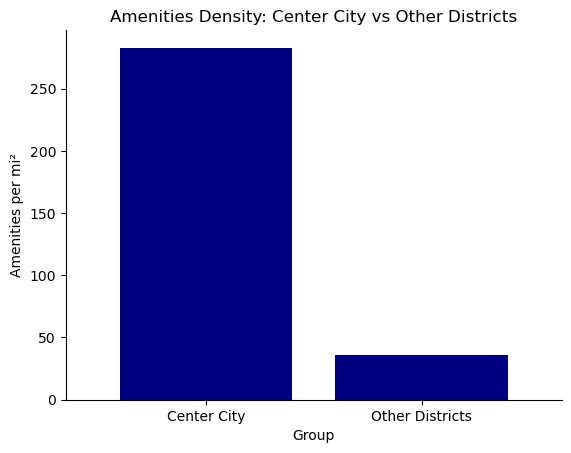

In [13]:
central_comp_sum = central_comp.groupby("group")[["total_amenities"]].sum()
central_comp_area = central_comp.groupby("group")[["area_mi2"]].first()
central_comp_bar = central_comp_sum.merge(central_comp_area, on = "group", how = "inner")
central_comp_bar["amenities_per_mi2"] = central_comp_bar["total_amenities"]/central_comp_bar["area_mi2"].round(2)

# plot
ax = central_comp_bar['amenities_per_mi2'].plot(kind='bar', color='navy', width=0.8, title='Amenities Density: Center City vs Other Districts')

# Remove top and right spines (box)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Optionally, you can also remove left and bottom spines if you prefer
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)

# Adjust other plot settings as needed
ax.set_ylabel('Amenities per mi²')
ax.set_xlabel('Group')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed

# Show the plot
plt.show()

In [36]:
central_comp_gdf = central_comp_gdf.merge(central_comp_bar, on = "group", how = "inner")
central_comp_gdf["amenities_per_mi2"] = central_comp_gdf["amenities_per_mi2"].round(0)

In [38]:
central_comp_gdf[["group", "amenities_per_mi2", "geometry"]].explore(tiles='CartoDB dark_matter', legend=True, column='amenities_per_mi2', categorical = True)

## What is the composition of Philadelphia's amenity landscape?

We used a wide range of terms to pull a range of amenity listings from Yelp's API. The top three categories are restaurant, beauty/grooming, and shopping.

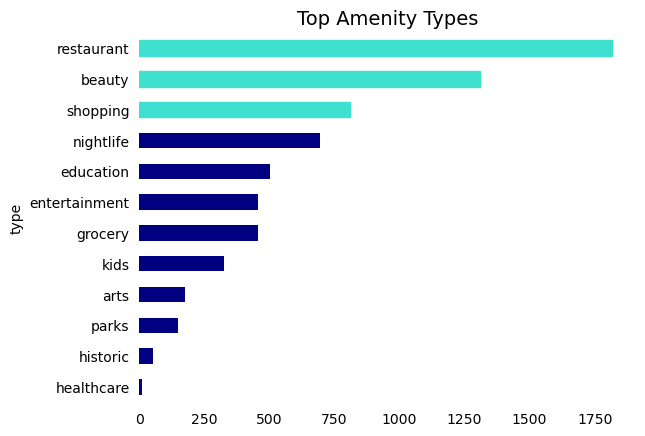

In [63]:
amenity_summed["count"] = amenity_summed["count"].astype(int)
amenities_ranked = amenity_summed[["type", "count"]].sort_values("count", ascending = False)

# Sort the DataFrame in descending order for the plot
amenities_ranked_sorted = amenities_ranked.sort_values('count', ascending=False)

# Create the horizontal bar plot
ax = amenities_ranked_sorted.plot.barh(x="type", y="count", color='navy', legend=False)

# Highlight the top 3 bars
bars = ax.patches
for bar in bars[:3]:  # Change the color of the top 3 bars
    bar.set_color('turquoise')

# Remove the spines (box) around the plot
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)  # Remove the bottom spine (x-axis line)

# Remove the ticks and labels for the x-axis
ax.tick_params(left=False, bottom=False)

# Invert the y-axis to have the highest value at the top
ax.invert_yaxis()

# Add a title
ax.set_title("Top Amenity Types", fontsize=14)

# Show the plot
plt.show()

Mapped separately, we can see distinct patterns in the locations of each type of amenity. Restaurants and beauty amenities lay in clusters spread throughout the city, while parks, arts, and nightlife are most concentrated in Center City. Historic landmarks, by contrast, are concentrated in the Old City area which houses a number of museums and historic sites.

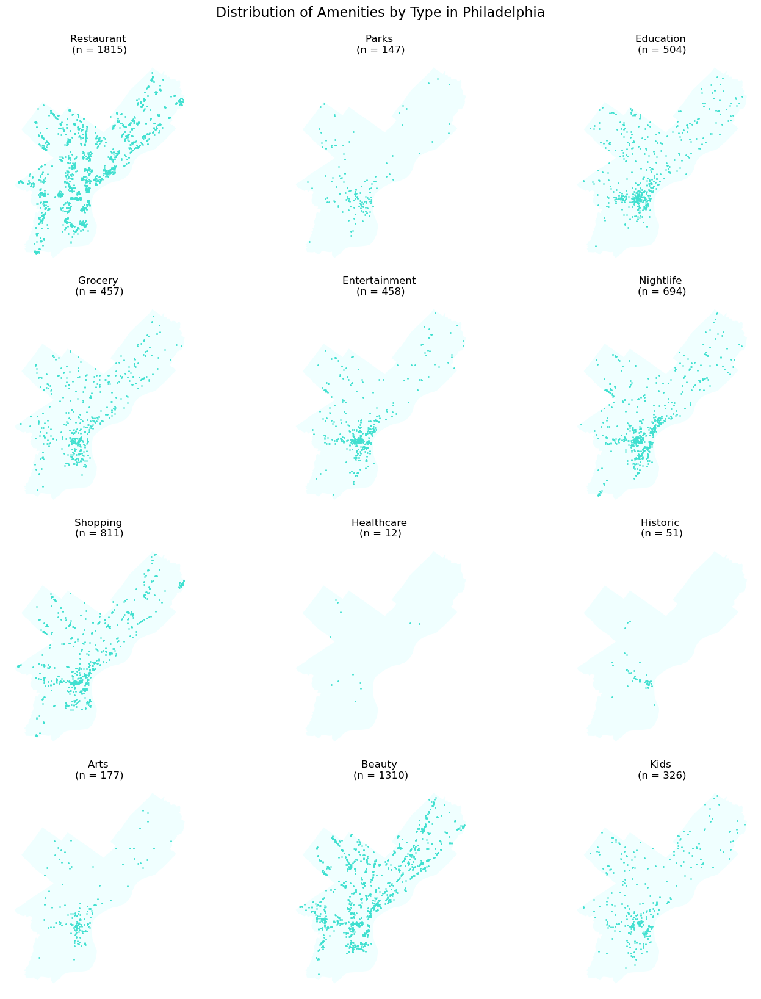

In [83]:
# Extract unique business types
business_types = amenity_point['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenity_point[amenity_point['type'] == business_type]

    # Get count for the current business type
    count = amenity_summed[amenity_summed['type'] == business_type]['count'].values[0]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='azure')
    
    # Plotting with transparency
    subset.plot(ax=axes[i], color='turquoise', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} \n(n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
    
# Adjust layout
plt.tight_layout()

# Add main title for the figure
fig.suptitle('Distribution of Amenities by Type in Philadelphia', fontsize=16, y=1.02)

# Display the panel of maps
plt.show()

## Where are hotspots for each amenity type?

To control for neighborhoods that have higher counts of amenities in general, we also calculate the percentage share of each type of amenity in each neighborhood. This way, we can characterize the spatial footprint of each amenity type independent of variations in amenity density.

Looking at the share of each amenity type in each neighborhood, it appears that amenities such as grocery stores, beauty/grooming services, and restaurants make up a consistently high share of the amenities in neighborhoods across Philadelphia. By contrast, only select neighborhoods are dominated by nightlife, parks, arts, and other forms of entertainment.

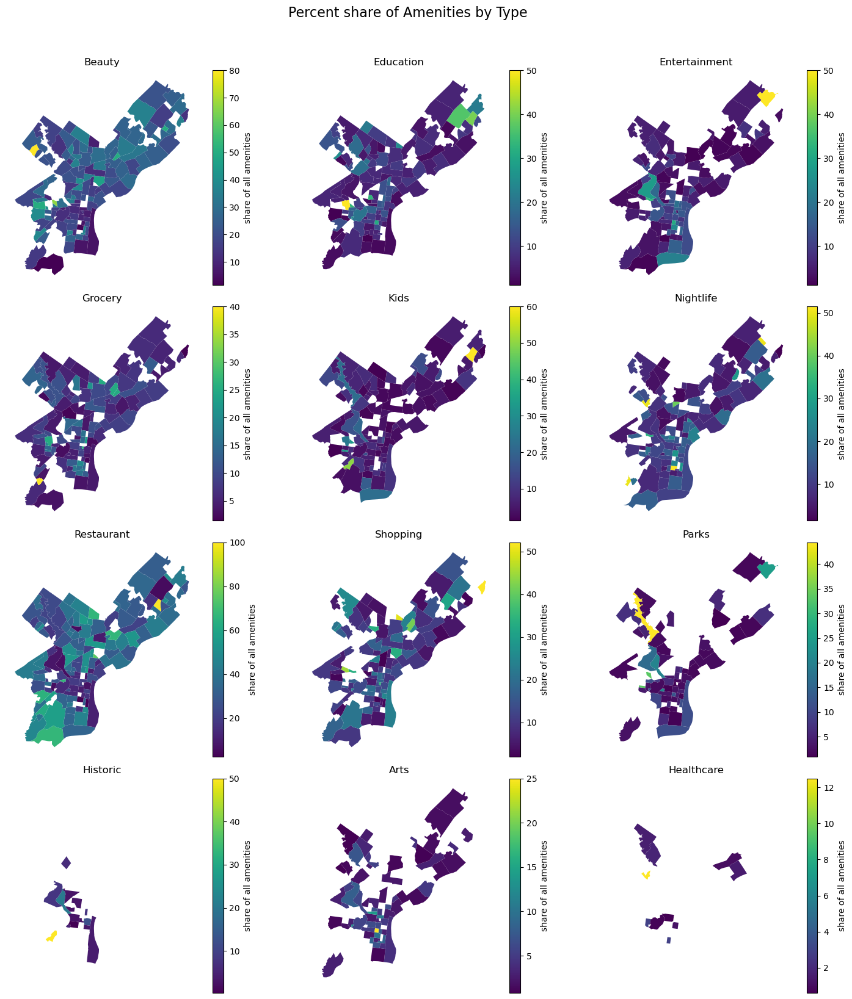

In [94]:
# Extract unique types
amenity_types = amenity_neigh['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenity_neigh[amenity_neigh['type'] == amenity_type]
    
    # phl boundary
    phl_bound_proj.plot(ax=axes[i], color='white')
    

    # Plotting
    subset.plot(column='pct_share', ax=axes[i], legend=True,
                legend_kwds={'label': "share of all amenities"},
                cmap='viridis')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

    
# Add main title for the figure
fig.suptitle('Percent share of Amenities by Type', fontsize=16, y=1.02)


# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

## Word clouds: yelp listings

The text within the Yelp listings also has a lot of information about the composition of Philadelphia's amenity landscape. First, in a wordcloud of all the titles of the listings, we can see "pizza", "salon", "bar", "school", "studio", "restaurant", and "park" are featured prominently. 

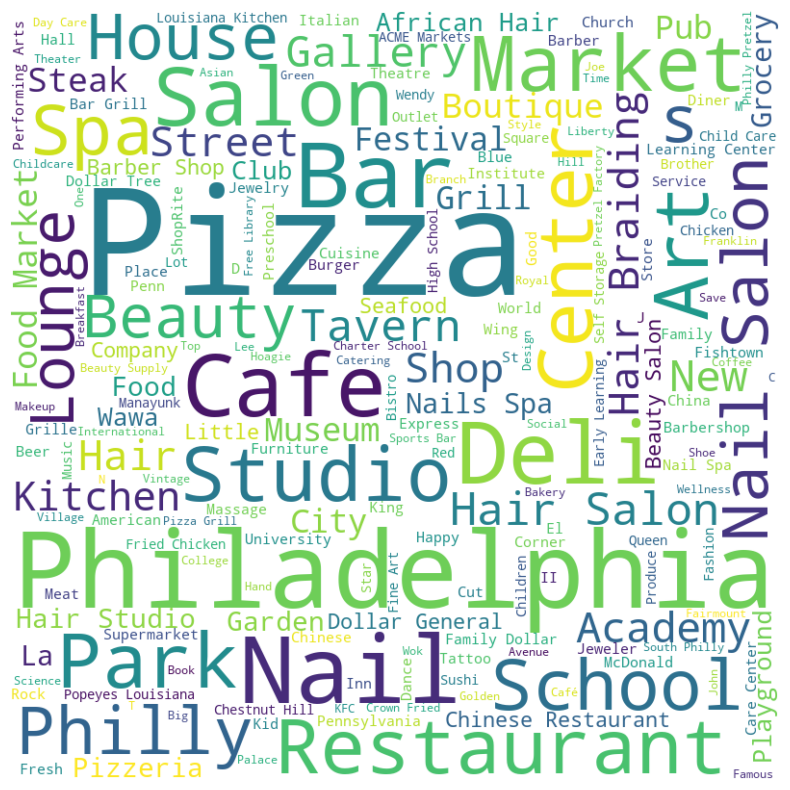

In [85]:
# Concatenate all text in the column
text = ' '.join(amenity_point["name"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Similarly, looking at the first word in yelp's "alias" field, we see that "bakeries", "cafes", "grocery", "theater", "sandwiches", and "delis" are some of the most prominent descriptions of amenity listings.

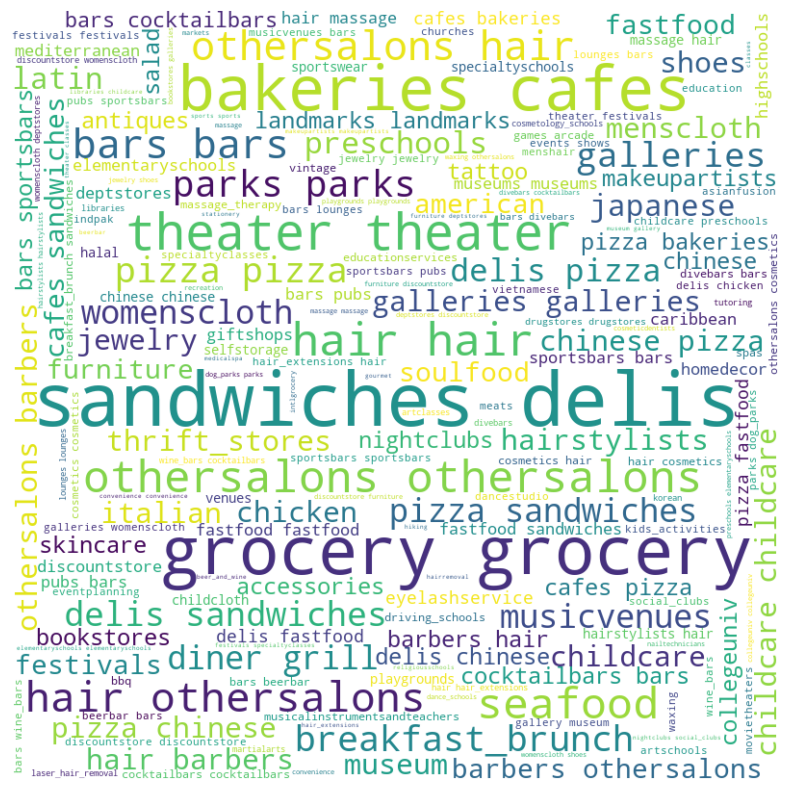

In [86]:
# Concatenate all text in the column
text = ' '.join(amenity_point["desc_1"].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=800, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Amenity type correlations
Looking at the correlations between the neighborhoods that amenity types are found in, we see moderately strong correlations between the locations of entertainment and arts amenities (0.52), kids and historic amenities (0.47), and restaurants and entertainment (-0.5). Overall, there are no categories with correlations over 0.75, suggesting that our categories are distinct and experience different spatial processes.

In [87]:
# spreading the data
amenity_neigh_wide = amenity_neigh.pivot_table(index='nb_name', columns='type', values='pct_share', aggfunc=np.mean).fillna(0)

# Calculating the correlation matrix
correlation_matrix = amenity_neigh_wide.corr()

# Mask to remove upper triangular matrix (including the diagonal)
mask = np.tril(np.ones_like(correlation_matrix, dtype=bool))

# Apply the mask to the correlation matrix
filtered_matrix = correlation_matrix.mask(mask)

# Reset index and melt for Altair
heatmap_data = filtered_matrix.reset_index().melt('type', var_name='type2', value_name='correlation').dropna()

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.4, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600)
chart

alt.LayerChart(...)

# How diverse are Philly's amenities?

## Restaurants
The category of restaurants has the highest variation of all our amenity categories. From formal sit-down restaurants to takeaway cheesesteak joints, we wanted to explore the diversity of the Philadelphia food scene. Following are the top 10 food categories, with "pizza" a clear winner at 323 restaurants, or 16.6% of all restaurants in Philly.

In [88]:
restaurants = amenity_point[amenity_point["type"] == "restaurant"]
restaurants_cat = restaurants.groupby("desc_1").size().sort_values(ascending=False).reset_index(name='count')
top_restaurants_cat = restaurants_cat.head(10)

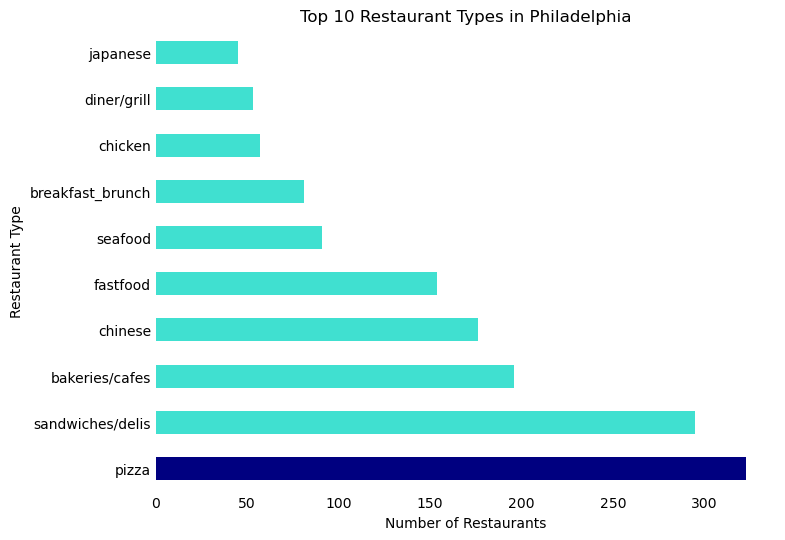

In [89]:
# Sort the DataFrame in descending order of 'count'
top_restaurants_cat_sorted = top_restaurants_cat.sort_values('count', ascending=False)

# Create a color list - default to turquoise, but navy for 'Pizza'
colors = ['navy' if x == 'pizza' else 'turquoise' for x in top_restaurants_cat_sorted['desc_1']]

# Create the horizontal bar plot with reversed axes
ax = top_restaurants_cat_sorted.plot.barh(x='desc_1', y='count', figsize=(8, 6), color=colors)

# Remove the box (spines)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Remove tick marks
ax.tick_params(axis='x', length=0)
ax.tick_params(axis='y', length=0)

# Remove legend
ax.legend().set_visible(False)

# Rename axes
ax.set_xlabel('Number of Restaurants')
ax.set_ylabel('Restaurant Type')

# Add title
ax.set_title('Top 10 Restaurant Types in Philadelphia')

# Display the plot
plt.show()

Mapping the most common restaurant type by neighborhood, we see that the northeast and far north are the main contributors to the count of pizza shops, while downtown is dominated by bakeries and cafes. 

In [90]:
restaurants_neigh = restaurants.sjoin(neigh)
restaurants_cat_neigh = restaurants_neigh.groupby(["nb_name", "desc_1"]).size().reset_index(name='count')
# get top restaurant type by neighborhood
top_cat_neigh = restaurants_cat_neigh.groupby("nb_name").apply(lambda x: x.nlargest(1, 'count')).reset_index(drop=True)

# join with neighborhoods
top_cat_neigh_gdf = top_cat_neigh.merge(neigh, on = "nb_name", how = "left")
top_cat_neigh_gdf = gpd.GeoDataFrame(top_cat_neigh_gdf, geometry = "geometry")
top_cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

In [97]:
cat_neigh = restaurants_cat_neigh.groupby("nb_name")
# join with neighborhoods
cat_neigh_gdf = cat_neigh.merge(neigh, on = "nb_name", how = "left")
cat_neigh_gdf = gpd.GeoDataFrame(cat_neigh_gdf, geometry = "geometry")
cat_neigh_gdf[["nb_name", "desc_1", "geometry"]].explore(tiles='CartoDB positron', legend=True, column='desc_1')

AttributeError: 'DataFrameGroupBy' object has no attribute 'merge'

# How do amenities vary geographically?

In [93]:
# incidence of amenity types by neighborhood (interactive choropleth)

In [92]:
# predominant cuisine by neighborhood (choropleth)

In [ ]:
# predominant nightlif by neighborhood